In [1]:
!pip install num2words evaluate bert_score

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.5/163.5 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 5.4 MB/s eta 0:00:00
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13706 sha256=58237ec9b25897c15f8bf6111b31aaec14d1e8228bdf5712d1ff8ab398d174af
  Stored in directory: /root/.cache/pip/wheels/1a/bf/a1/4cee4f7678c68c5875ca89eaccf460593539805c3906722228
Successfully built docopt


In [2]:
import torch
from transformers import AutoProcessor, AutoModelForImageTextToText
from PIL import Image
import num2words
import torch
import torch.nn as nn
from transformers import ViTModel, AutoImageProcessor
from transformers.modeling_outputs import BaseModelOutput
import matplotlib.pyplot as plt
import numpy as np
from functools import partial
from torchvision.transforms import functional as F_transforms
from huggingface_hub import PyTorchModelHubMixin

# Load Dataset and Model

In [3]:
model_path = "HuggingFaceTB/SmolVLM2-2.2B-Instruct"

processor = AutoProcessor.from_pretrained(model_path)
model = AutoModelForImageTextToText.from_pretrained(
    model_path,
    torch_dtype=torch.bfloat16,
    device_map="cuda",
)

processor.image_processor.max_image_size["longest_edge"]= 384
processor.image_processor.do_image_splitting=False
processor.image_processor.do_resize=True

for param in model.parameters():
    param.requires_grad = False

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


processor_config.json:   0%|          | 0.00/67.0 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/430 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/599 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/868 [00:00<?, ?B/s]

You have video processor config saved in `preprocessor.json` file which is deprecated. Video processor configs should be saved in their own `video_preprocessor.json` file. You can rename the file or load and save the processor back which renames it automatically. Loading from `preprocessor.json` will be removed in v5.0.


config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.03G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/136 [00:00<?, ?B/s]

In [4]:
from datasets import load_dataset
import json
from datasets import Dataset

drive_lm = load_dataset("MehdiJmlkh/DriveLM")
nuscenes = load_dataset("MehdiJmlkh/nuscenes")

class DriveLM:
    def __init__(self, drive_lm, nuscenes):
        self.drive_lm = drive_lm
        self.nuscenes = nuscenes

    def __getitem__(self, idx):
      sample = self.drive_lm[idx]
      nuscenes_index = sample["nuscenes_index"]
      sample['images'] = self.nuscenes[nuscenes_index]

      return sample

    def __len__(self):
        return len(self.drive_lm)

README.md:   0%|          | 0.00/718 [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/2.00M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/257k [00:00<?, ?B/s]

eval-00000-of-00001.parquet:   0%|          | 0.00/246k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/106338 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/13292 [00:00<?, ? examples/s]

Generating eval split:   0%|          | 0/13293 [00:00<?, ? examples/s]

README.md:   0%|          | 0.00/703 [00:00<?, ?B/s]

train-00000-of-00006.parquet:   0%|          | 0.00/454M [00:00<?, ?B/s]

train-00001-of-00006.parquet:   0%|          | 0.00/462M [00:00<?, ?B/s]

train-00002-of-00006.parquet:   0%|          | 0.00/465M [00:00<?, ?B/s]

train-00003-of-00006.parquet:   0%|          | 0.00/456M [00:00<?, ?B/s]

train-00004-of-00006.parquet:   0%|          | 0.00/469M [00:00<?, ?B/s]

train-00005-of-00006.parquet:   0%|          | 0.00/469M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/369M [00:00<?, ?B/s]

eval-00000-of-00001.parquet:   0%|          | 0.00/355M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3241 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/422 [00:00<?, ? examples/s]

Generating eval split:   0%|          | 0/411 [00:00<?, ? examples/s]

In [5]:
dataset = {split: DriveLM(drive_lm[split].select(range(1000)), nuscenes[split]) for split in ["train"]}

In [6]:
test_dataset = {split: DriveLM(drive_lm[split].select(range(1000)), nuscenes[split]) for split in ["test"]}

In [7]:
from torch.utils.data import Dataset

class VLMQATestDataset(Dataset):
    def __init__(self, dataset: DriveLM, is_train=True):
        self.dataset = dataset
        self.is_train = is_train

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]

        user_msg = []
        cameras = ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT', 'CAM_BACK_LEFT', 'CAM_BACK', 'CAM_BACK_RIGHT']
        for camera in cameras:
            user_msg.extend([
                {"type": "text", "text": camera},
                {"type": "image", "image": item["images"][camera]}
            ])

        user_msg.append({
            "type": "text",
            "text":f"Scene description:{item['scene_description']} Question: {item['question']}"
        })

        assistant_msg = [{"type": "text", "text": item["answer"]}]

        if not self.is_train:
            conversation = [
                {
                    "role": "user",
                    "content": user_msg
                }
            ]
            return self.__apply_chat_template(conversation, True)


        conversation = [
            {
                "role": "user",
                "content": user_msg
            }
        ]
        inputs = self.__apply_chat_template(conversation)

        label_start_idx = self.__get_label_start_idx(inputs)

        labels = inputs['input_ids'].clone()
        labels[:, :label_start_idx] = -100
        inputs['labels'] = labels

        return inputs

    def __apply_chat_template(self, conversation, add_generation_prompt=False):
        return processor.apply_chat_template(
            conversation,
            add_generation_prompt=add_generation_prompt,
            tokenize=True,
            return_dict=True,
            return_tensors="pt"
        )

    def __get_label_start_idx(self, inputs):
        utterance_id = processor.tokenizer.convert_tokens_to_ids('<end_of_utterance>')
        utterance_idx = inputs['input_ids'][0].tolist().index(utterance_id)
        num_assistant_ids = 4
        label_idx = utterance_idx + num_assistant_ids + 1

        return label_idx

In [8]:
test_ds = VLMQATestDataset(test_dataset["test"])

# manual test for raw model

In [ ]:
import matplotlib.pyplot as plt

index = 0

def display_sample_and_output(index, model):
    sample = test_dataset["test"][index]

    def display_image(image, title):
        plt.imshow(image)
        plt.axis('off')
        plt.title(title)

    plt.figure(figsize=(20, 8))
    cameras = ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT', 'CAM_BACK_LEFT', 'CAM_BACK', 'CAM_BACK_RIGHT']
    for i, camera in enumerate(cameras):
        plt.subplot(2, 3, i + 1)
        display_image(sample['images'][camera], camera)
    plt.tight_layout()
    plt.show()

    for key, value in sample.items():
        if type(value) is str:
            print(f"{key}: {value}")

    output = model.generate(**test_ds[index].to("cuda", dtype=torch.bfloat16), max_new_tokens=32)
    generated_texts = processor.batch_decode(output, skip_special_tokens=True)
    print("model answer: " + generated_texts[0].split("Assistant: ")[-1])

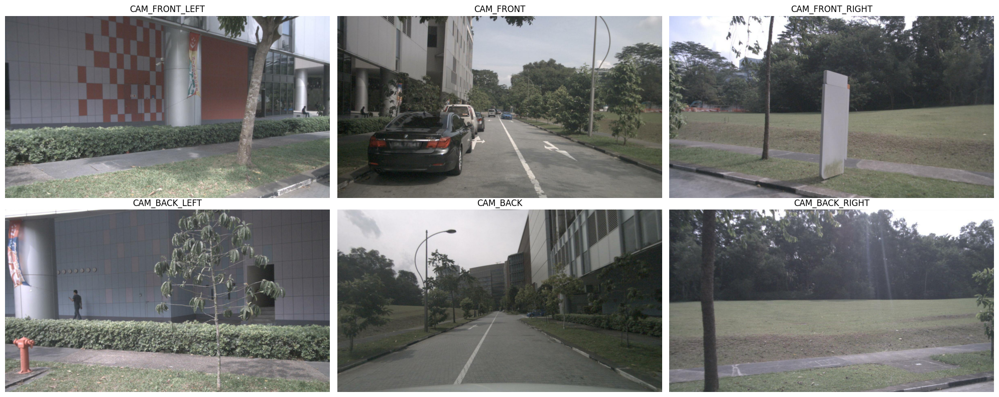

scene_token: 1c89941a6935484182ca19eddcd3bc77
frame_token: 65fa49db041645fcb7ff268685bd50da
scene_description: The ego vehicle proceeds along the current road, halts and awaits the passage of the vehicles on the right side.
task: perception
question: Please describe the current scene.
answer: There is one moving car in front of the ego car, one moving car behind the ego car, and three parked cars in front of the ego car.
model answer: The scene is a street with a sidewalk, trees, and buildings. There are vehicles on the road, and the sky is cloudy.


In [ ]:
display_sample_and_output(0, model)

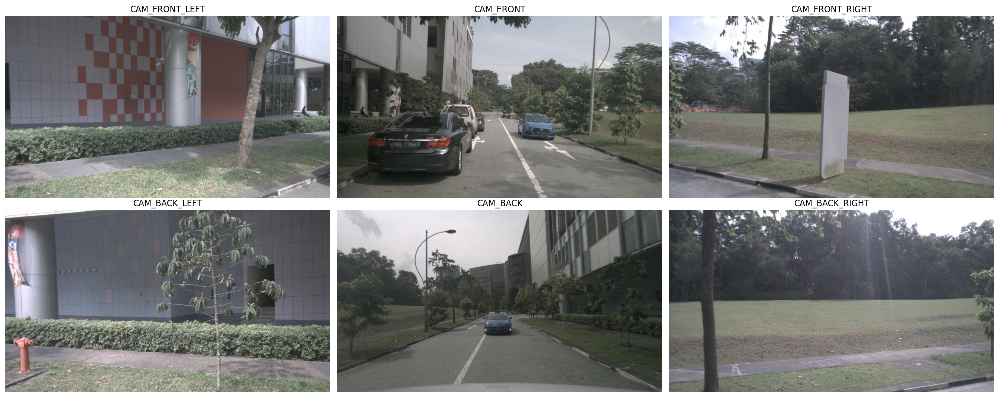

scene_token: 1c89941a6935484182ca19eddcd3bc77
frame_token: d88aa76156b24f4580004bcf438a4303
scene_description: The ego vehicle proceeds along the current road, halts and awaits the passage of the vehicles on the right side.
task: perception
question: Are there moving pedestrians to the back left of the ego car?
answer: Yes.
model answer: There are no moving pedestrians to the back left of the ego car.


In [ ]:
display_sample_and_output(20, model)

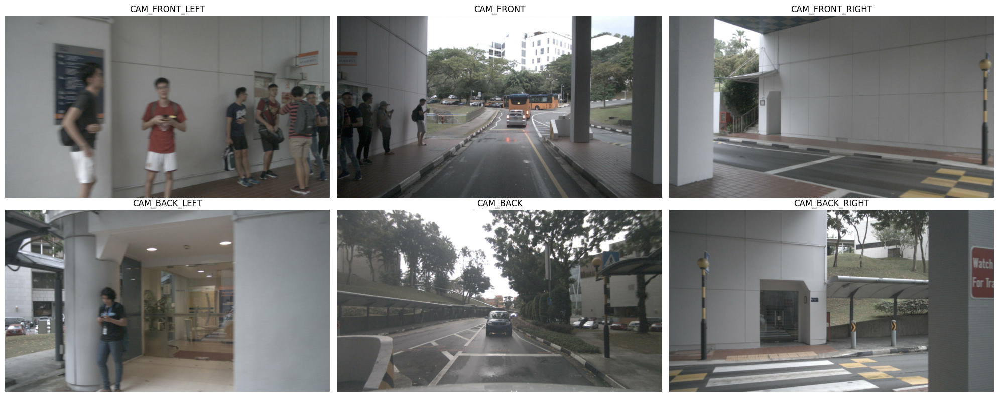

scene_token: 88abbe4f3b37466791b2ae58490044d9
frame_token: a46026e186a84b6fa0fdb4e8c22734b7
scene_description: The ego vehicle proceeds forward along the current road, passes the crowd on the left, and then follows the preceding vehicles to halt and wait.
task: perception
question: What is the status of the pedestrians that are to the back left of the ego car?
answer: Two of the pedestrians are moving, and one is standing.
model answer: The pedestrians are waiting for the ego car to proceed.


In [ ]:
display_sample_and_output(200, model)

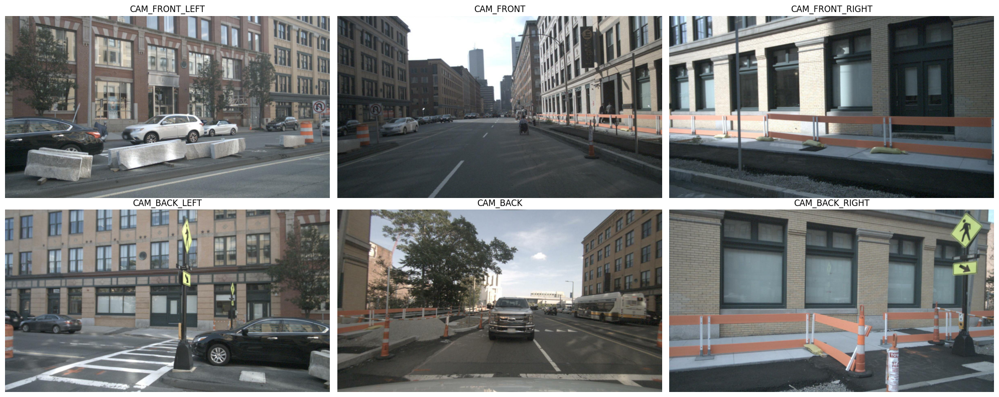

scene_token: 70c3b2f2b1f3403083fd44d06cc5abe0
frame_token: 9566e03d1a9547c0870e366fdc4328c5
scene_description: The ego vehicle proceeds straight along the current road and encounters construction sections on both sides.
task: perception
question: Are there motorcycles without riders to the front left of the ego car?
answer: Yes.
model answer: There are no motorcycles without riders to the front left of the ego car.


In [ ]:
display_sample_and_output(500, model)

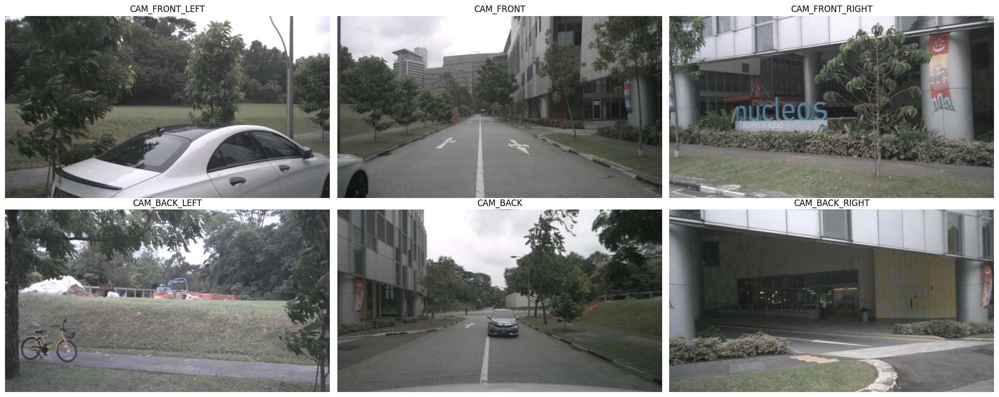

scene_token: d0880a386b6d434bb5cd13c134af7a3e
frame_token: ef969c90f4294fc3abc0ecd7d85c49a9
scene_description: The ego vehicle proceeds along the current road, encountering a stationary vehicle on the left side, evades it, and continues to move forward.
task: perception
question: What are objects to the back left of the ego car?
answer: There is one construction vehicle and one bicycle to the back left of the ego car.
model answer: The objects to the back left of the ego car are a tree and a bicycle.


In [ ]:
display_sample_and_output(999, model)

# evaluation for raw model

In [ ]:
import matplotlib.pyplot as plt

refs=[]
preds=[]

for index in range(0, len(test_ds), 10):
    sample = test_dataset["test"][index]

    refs.append(sample['answer'])


    output = model.generate(**test_ds[index].to("cuda", dtype=torch.bfloat16), max_new_tokens=32)
    generated_texts = processor.batch_decode(output, skip_special_tokens=True)
    preds.append(generated_texts[0].split("Assistant: ")[-1])
    print(".", end="")

...................................................................................................

In [ ]:
import evaluate

bleu = evaluate.load("bleu")
bertscore = evaluate.load("bertscore")

bleu_result = bleu.compute(predictions=preds, references=refs)

bert_result = bertscore.compute(predictions=preds, references=refs, lang="en")

scores = {
      "BLEU": bleu_result["bleu"],
      "BERTScore_P": sum(bert_result["precision"]) / len(bert_result["precision"]),
      "BERTScore_R": sum(bert_result["recall"]) / len(bert_result["recall"]),
      "BERTScore_F1": sum(bert_result["f1"]) / len(bert_result["f1"])
    }

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
bert_result

{'precision': [0.878101646900177,
  0.889178991317749,
  0.8323870897293091,
  0.8557569980621338,
  0.8509165048599243,
  0.8319003582000732,
  0.9160628318786621,
  0.8792918920516968,
  0.9305887818336487,
  0.8836015462875366,
  0.8922060132026672,
  0.8323870897293091,
  0.8716104030609131,
  0.8462576866149902,
  0.8437557220458984,
  0.8531808257102966,
  0.8417874574661255,
  0.9014779329299927,
  0.8403003811836243,
  0.8247056007385254,
  0.8766394853591919,
  0.8511621952056885,
  0.8526315689086914,
  0.8862093687057495,
  0.8505718111991882,
  0.8567560911178589,
  0.9469602108001709,
  0.8992578983306885,
  0.8377057909965515,
  0.8515875339508057,
  0.8985310792922974,
  0.9178350567817688,
  0.8381560444831848,
  0.8540467619895935,
  0.8459174633026123,
  0.8873710632324219,
  0.9116246700286865,
  0.8510081171989441,
  0.8349460363388062,
  0.9079267978668213,
  0.9226725697517395,
  0.840327799320221,
  0.8559938073158264,
  0.8928244113922119,
  0.849031925201416,
 

In [ ]:
bleu_result

{'bleu': 0.09006756129883932,
 'precisions': [0.2525930445393533,
  0.09616634178037686,
  0.06045865184155664,
  0.04480955937266617],
 'brevity_penalty': 1.0,
 'length_ratio': 1.5959104186952289,
 'translation_length': 1639,
 'reference_length': 1027}

In [ ]:
scores

{'BLEU': 0.09006756129883932,
 'BERTScore_P': 0.8692312473058701,
 'BERTScore_R': 0.9168985331058502,
 'BERTScore_F1': 0.8917563009262085}

In [ ]:
import numpy as np

def get_lowest_k(scores, k=5):
    scores = np.array(scores)
    lowest_indices = scores.argsort()[:k]
    lowest_scores = scores[lowest_indices]
    return list(lowest_scores), list(lowest_indices)

low_prec, low_prec_idx = get_lowest_k(bert_result["precision"])
low_rec, low_rec_idx   = get_lowest_k(bert_result["recall"])
low_f1, low_f1_idx     = get_lowest_k(bert_result["f1"])

print(f"Lowest 5 BERTScore Precision: {low_prec} at indices {low_prec_idx}")
print(f"Lowest 5 BERTScore Recall: {low_rec} at indices {low_rec_idx}")
print(f"Lowest 5 BERTScore F1: {low_f1} at indices {low_f1_idx}")
print(f"Lowest 5 BELU F1: {low_f1} at indices {low_f1_idx}")

Lowest 5 BERTScore Precision: [np.float64(0.8247056007385254), np.float64(0.8268681764602661), np.float64(0.8319003582000732), np.float64(0.8323870897293091), np.float64(0.8323870897293091)] at indices [np.int64(19), np.int64(50), np.int64(5), np.int64(11), np.int64(2)]
Lowest 5 BERTScore Recall: [np.float64(0.7762110233306885), np.float64(0.7776010036468506), np.float64(0.8244717121124268), np.float64(0.8257663249969482), np.float64(0.8266342282295227)] at indices [np.int64(9), np.int64(7), np.int64(94), np.int64(38), np.int64(25)]
Lowest 5 BERTScore F1: [np.float64(0.8253257870674133), np.float64(0.8264322280883789), np.float64(0.8303307890892029), np.float64(0.8312388062477112), np.float64(0.8414256572723389)] at indices [np.int64(7), np.int64(9), np.int64(38), np.int64(19), np.int64(25)]
Lowest 5 BELU F1: [np.float64(0.8253257870674133), np.float64(0.8264322280883789), np.float64(0.8303307890892029), np.float64(0.8312388062477112), np.float64(0.8414256572723389)] at indices [np.int

In [ ]:
for idx in low_prec_idx:
    print(f"Lowest precision label {idx}: " + refs[idx] + "\nLowest precision answer: " + preds[idx])

Lowest precision label 19: Keep going at the same speed, slightly offset to the left.
Lowest precision answer: In this scenario, the safe actions for the ego vehicle would be to follow the traffic rules, such as stopping at the designated stop line, waiting
Lowest precision label 50: Yes.
Lowest precision answer: There are no motorcycles without riders to the front left of the ego car.
Lowest precision label 5: None.
Lowest precision answer: The traffic signal that the ego vehicle should pay attention to is the one on the right side of the road.
Lowest precision label 11: Yes.
Lowest precision answer: There are no moving pedestrians to the back left of the ego car.
Lowest precision label 2: Yes.
Lowest precision answer: There are no moving pedestrians to the back left of the ego car.


In [ ]:
for idx in low_rec_idx:
    print(f"Lowest recall label {idx}: " + refs[idx] + "\nLowest recall answer: " + preds[idx])

Lowest recall label 9: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 1010.76, 618.58, 1186.13, 720.46), (road sign, turn right, 1010.76, 618.58, 1186.13, 720.46), (road sign, go straight, 733.46, 511.74, 764.7, 519.99), (road sign, turn left, 733.46, 511.74, 764.7, 519.99), (road sign, turn right, 733.46, 511.74, 764.7, 519.99)].
Lowest recall answer: The traffic elements in the front view are:
1. A black car on the left side of the road.
2. A blue car
Lowest recall label 7: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 940.32, 543.31, 985.43, 563.8), (road sign, turn right, 940.32, 543.31, 985.43, 563.8), (road sign, go straight, 879.14, 506.74, 893.64, 513.52), (road sign, turn right, 879.14, 506.74, 893.64, 513.52)].
Lowest recall answer: The traffic elements in the front view are:
1. A car on the road, categorized as a vehicle, with

In [ ]:
for idx in low_f1_idx:
    print(f"Lowest F1 label {idx}: " + refs[idx] + "\nLowest F1 answer: " + preds[idx])

Lowest F1 label 7: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 940.32, 543.31, 985.43, 563.8), (road sign, turn right, 940.32, 543.31, 985.43, 563.8), (road sign, go straight, 879.14, 506.74, 893.64, 513.52), (road sign, turn right, 879.14, 506.74, 893.64, 513.52)].
Lowest F1 answer: The traffic elements in the front view are:
1. A car on the road, categorized as a vehicle, with a status of moving,
Lowest F1 label 9: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 1010.76, 618.58, 1186.13, 720.46), (road sign, turn right, 1010.76, 618.58, 1186.13, 720.46), (road sign, go straight, 733.46, 511.74, 764.7, 519.99), (road sign, turn left, 733.46, 511.74, 764.7, 519.99), (road sign, turn right, 733.46, 511.74, 764.7, 519.99)].
Lowest F1 answer: The traffic elements in the front view are:
1. A black car on the left side of the road.
2. A blue

# Fine-tune

In [9]:
def display_output(inputs, outputs, loss, global_step):
    logits = outputs.logits  # (batch, seq_len, vocab_size)
    pred_ids = torch.argmax(logits, dim=-1)  # (batch, seq_len)

    labels = inputs["labels"].clone()

    mask = labels != -100
    pred_ids_filtered = [p[m].tolist() for p, m in zip(pred_ids, mask)]
    label_ids_filtered = [l[m].tolist() for l, m in zip(labels, mask)]

    pred_text = processor.tokenizer.batch_decode(pred_ids_filtered, skip_special_tokens=True)
    label_text = processor.tokenizer.batch_decode(label_ids_filtered, skip_special_tokens=True)

    print(f"Step: {global_step}, Loss: {loss: .4}")
    print("Prediction:", pred_text[0])
    print("Target:", label_text[0], end='', sep='')
    print("-" * 50)

In [10]:
epochs = 1
batch_size = 1
learning_rate = 2e-5
save_steps = 10
logging_steps = 10

In [11]:
from transformers import Trainer
from transformers.trainer import _is_peft_model
from transformers.models.auto.modeling_auto import MODEL_FOR_CAUSAL_LM_MAPPING_NAMES

class OutputDisplayTrainer(Trainer):
    global_step = 1
    logging_steps = logging_steps
    def compute_loss(
        self,
        model: nn.Module,
        inputs,
        return_outputs: bool = False,
        num_items_in_batch= None,
    ):

        if (self.label_smoother is not None or self.compute_loss_func is not None) and "labels" in inputs:
            labels = inputs.pop("labels")
        else:
            labels = None
        if self.model_accepts_loss_kwargs:
            kwargs = {}
            if num_items_in_batch is not None:
                kwargs["num_items_in_batch"] = num_items_in_batch
            inputs = {**inputs, **kwargs}
        outputs = model(**inputs)

        if self.args.past_index >= 0:
            self._past = outputs[self.args.past_index]

        if labels is not None:
            unwrapped_model = self.accelerator.unwrap_model(model)
            if _is_peft_model(unwrapped_model):
                model_name = unwrapped_model.base_model.model._get_name()
            else:
                model_name = unwrapped_model._get_name()

            if self.compute_loss_func is not None:
                loss = self.compute_loss_func(outputs, labels, num_items_in_batch=num_items_in_batch)
            elif model_name in MODEL_FOR_CAUSAL_LM_MAPPING_NAMES.values():
                loss = self.label_smoother(outputs, labels, shift_labels=True)
            else:
                loss = self.label_smoother(outputs, labels)
        else:
            if isinstance(outputs, dict) and "loss" not in outputs:
                raise ValueError(
                    "The model did not return a loss from the inputs, only the following keys: "
                    f"{','.join(outputs.keys())}. For reference, the inputs it received are {','.join(inputs.keys())}."
                )

            loss = outputs["loss"] if isinstance(outputs, dict) else outputs[0]

        if (
            self.args.average_tokens_across_devices
            and (self.model_accepts_loss_kwargs or self.compute_loss_func)
            and num_items_in_batch is not None
        ):
            loss *= self.accelerator.num_processes

        if OutputDisplayTrainer.global_step % OutputDisplayTrainer.logging_steps == 0:
            display_output(inputs, outputs, loss, OutputDisplayTrainer.global_step)
        OutputDisplayTrainer.global_step += 1

        return (loss, outputs) if return_outputs else loss


In [12]:
import torch
import gc

torch.cuda.empty_cache()
gc.collect()

0

In [13]:
from peft import LoraConfig, get_peft_model
from transformers import Trainer, TrainingArguments
from peft import PeftModel

peft_config = LoraConfig(
    r=16,
    lora_alpha=16,
    target_modules="all-linear",
    lora_dropout=0.05,
    task_type="CAUSAL_LM",
)

peft_model = get_peft_model(model, peft_config)

# peft_model = PeftModel.from_pretrained(model, "MehdiJmlkh/SmolDriver-Peft", is_trainable=True)

for param in peft_model.model.model.vision_model.parameters():
    param.requires_grad = True

In [14]:
from torch.utils.data import Dataset

class VLMQADataset(Dataset):
    def __init__(self, dataset: DriveLM, is_train=True):
        self.dataset = dataset
        self.is_train = is_train

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]

        user_msg = []
        cameras = ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT', 'CAM_BACK_LEFT', 'CAM_BACK', 'CAM_BACK_RIGHT']
        for camera in cameras:
            user_msg.extend([
                {"type": "text", "text": camera},
                {"type": "image", "image": item["images"][camera]}
            ])

        user_msg.append({
            "type": "text",
            "text":f"Scene description:{item['scene_description']} Question: {item['question']}"
        })

        assistant_msg = [{"type": "text", "text": item["answer"]}]

        if not self.is_train:
            conversation = [
                {
                    "role": "user",
                    "content": user_msg
                }
            ]
            return self.__apply_chat_template(conversation, True)


        conversation = [
            {
                "role": "user",
                "content": user_msg
            },
            {
                "role": "assistant",
                "content": assistant_msg
            }
        ]
        inputs = self.__apply_chat_template(conversation)

        label_start_idx = self.__get_label_start_idx(inputs)

        labels = inputs['input_ids'].clone()
        labels[:, :label_start_idx] = -100
        inputs['labels'] = labels

        return inputs

    def __apply_chat_template(self, conversation, add_generation_prompt=False):
        return processor.apply_chat_template(
            conversation,
            add_generation_prompt=add_generation_prompt,
            tokenize=True,
            return_dict=True,
            return_tensors="pt"
        )

    def __get_label_start_idx(self, inputs):
        utterance_id = processor.tokenizer.convert_tokens_to_ids('<end_of_utterance>')
        utterance_idx = inputs['input_ids'][0].tolist().index(utterance_id)
        num_assistant_ids = 4
        label_idx = utterance_idx + num_assistant_ids + 1

        return label_idx

In [15]:
from transformers import Trainer, TrainingArguments

train_dataset = VLMQADataset(dataset["train"])

training_args = TrainingArguments(
    output_dir="./fine-tune-checkpoints",
    per_device_train_batch_size=batch_size,
    num_train_epochs=epochs,
    learning_rate=learning_rate,
    logging_steps=logging_steps,
    bf16=True,
    report_to="none",
    label_names=["labels"],
    gradient_checkpointing=True,
    save_total_limit=2,
    # save_strategy="steps",
    # save_steps=save_steps,
    seed=42,
    data_seed=42,
)


def pad_labels(labels):
    pad_token_label_id = -100
    max_len = max(len(label) for label in labels)

    padded_labels = torch.stack([
        torch.cat([torch.full((max_len - len(label),), pad_token_label_id), label])
        for label in labels
    ])

    return padded_labels


def data_collator(features):
    # return features[0]

    features_flatten = []
    labels = []
    pixel_values = []
    for feature in features:
        labels.append(feature['labels'].flatten())
        pixel_values.append(feature['pixel_values'])
        del feature['labels']
        del feature['pixel_values']

        for key, item in feature.items():
            feature[key] = item[0]
        features_flatten.append(feature)

    batch = processor.tokenizer.pad(features_flatten, padding=True, return_tensors="pt")
    batch['labels'] = pad_labels(labels)
    batch['pixel_values'] = torch.concatenate(pixel_values)

    return batch

trainer = OutputDisplayTrainer(
    model=peft_model,
    args=training_args,
    train_dataset=train_dataset,
    data_collator=data_collator,
)

trainer.train()

You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
`loss_type=None` was set in the config but it is unrecognised.Using the default loss: `ForCausalLMLoss`.


Step,Training Loss
10,1.692700
20,1.094400
30,1.492100
40,1.041300
50,0.503100
60,1.593100
70,0.818100
80,1.054900
90,0.951900
100,1.387900


Step: 10, Loss:  2.063
Prediction:  cars are stopped forward
R
Target: Three cars are moving.
--------------------------------------------------
Step: 20, Loss:  0.8093
Prediction: ,
R
Target: No.
--------------------------------------------------
Step: 30, Loss:  2.251
Prediction:  are a vehicle vehicle, the of the ego vehicle, There
Ass
Target: There is one moving car in front of the ego car.
--------------------------------------------------
Step: 40, Loss:  0.2881
Prediction: .
Ass
Target: Yes.
--------------------------------------------------
Step: 50, Loss:  0.6013
Prediction:  pedestrian is the front right of the ego car is standing.
Ass
Target: The pedestrian to the front right of the ego car is moving.
--------------------------------------------------
Step: 60, Loss:  2.096
Prediction:  ego vehicle will likely to. answer vehicle is going going.
Ass
Target: The ego vehicle is going straight. The ego vehicle is not moving.
--------------------------------------------------
Ste

Step,Training Loss
10,1.692700
20,1.094400
30,1.492100
40,1.041300
50,0.503100
60,1.593100
70,0.818100
80,1.054900
90,0.951900
100,1.387900


TrainOutput(global_step=1000, training_loss=0.6481156706809997, metrics={'train_runtime': 11973.8437, 'train_samples_per_second': 0.084, 'train_steps_per_second': 0.084, 'total_flos': 7762815968537760.0, 'train_loss': 0.6481156706809997, 'epoch': 1.0})

In [16]:
import torch
import gc

torch.cuda.empty_cache()
gc.collect()

3376

# eval fine tuned model

In [17]:
peft_model.gradient_checkpointing_disable()

output = peft_model.generate(**test_ds[0].to("cuda", dtype=torch.bfloat16), max_new_tokens=128)
generated_texts = processor.batch_decode(output, skip_special_tokens=True)
print("peft model answer: " + generated_texts[0].split("Assistant: ")[-1])

peft model answer: There are two pedestrians, one moving and one standing, and two cars, one moving and one parked, on the road. There are two fire hydrants, one on the left and one on the right, and one traffic cone on the left. There are two trees, one on the left and one on the right, and one flag on the left. There are two benches, one on the left and one on the right, and one trash can on the right. There are two traffic signs, one on the left and one on the right. There are two street lamps, one on the left and one on the


In [18]:
generated_texts

['User: CAM_FRONT_LEFTCAM_FRONTCAM_FRONT_RIGHTCAM_BACK_LEFTCAM_BACKCAM_BACK_RIGHTScene description:The ego vehicle proceeds along the current road, halts and awaits the passage of the vehicles on the right side. Question: Please describe the current scene.\nAssistant: There are two pedestrians, one moving and one standing, and two cars, one moving and one parked, on the road. There are two fire hydrants, one on the left and one on the right, and one traffic cone on the left. There are two trees, one on the left and one on the right, and one flag on the left. There are two benches, one on the left and one on the right, and one trash can on the right. There are two traffic signs, one on the left and one on the right. There are two street lamps, one on the left and one on the']

In [19]:
import matplotlib.pyplot as plt

refs=[]
preds=[]

for index in range(0, len(test_ds), 10):
    sample = test_dataset["test"][index]

    refs.append(sample['answer'])


    output = peft_model.generate(**test_ds[index].to("cuda", dtype=torch.bfloat16), max_new_tokens=32)
    generated_texts = processor.batch_decode(output, skip_special_tokens=True)
    preds.append(generated_texts[0].split("Assistant: ")[-1])
    print(".", end="")

....................................................................................................

In [20]:
import evaluate

bleu = evaluate.load("bleu")
bertscore = evaluate.load("bertscore")

bleu_result = bleu.compute(predictions=preds, references=refs)

bert_result = bertscore.compute(predictions=preds, references=refs, lang="en")

scores = {
      "BLEU": bleu_result["bleu"],
      "BERTScore_P": sum(bert_result["precision"]) / len(bert_result["precision"]),
      "BERTScore_R": sum(bert_result["recall"]) / len(bert_result["recall"]),
      "BERTScore_F1": sum(bert_result["f1"]) / len(bert_result["f1"])
    }

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/482 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [21]:
bert_result

{'precision': [0.8747718334197998,
  0.9641767144203186,
  1.0,
  0.8708701729774475,
  0.9999995231628418,
  1.000000238418579,
  0.9563087224960327,
  0.8079574108123779,
  0.9830548167228699,
  0.8036064505577087,
  1.0,
  1.0,
  0.9999998807907104,
  0.9945030808448792,
  0.8430725336074829,
  0.9945030808448792,
  0.8852244019508362,
  0.9455838203430176,
  0.9999995231628418,
  0.8296487331390381,
  0.9471440315246582,
  0.9945030808448792,
  1.0,
  0.9612855911254883,
  0.9999995231628418,
  0.9124995470046997,
  0.9865326881408691,
  0.9352561831474304,
  0.9999995231628418,
  1.0,
  0.9552502632141113,
  1.0000001192092896,
  0.9999995231628418,
  1.0,
  0.8734886050224304,
  0.9820294380187988,
  0.9479755163192749,
  1.0,
  0.8326952457427979,
  1.0000001192092896,
  0.9999998807907104,
  1.0,
  0.8867825865745544,
  0.973015546798706,
  1.0,
  1.0,
  0.9308980107307434,
  0.9177933931350708,
  0.9999995231628418,
  1.0,
  0.9945030808448792,
  0.9469122886657715,
  0.929520

In [22]:
bleu_result

{'bleu': 0.20444531587037948,
 'precisions': [0.6416184971098265,
  0.39864864864864863,
  0.25609756097560976,
  0.18493150684931506],
 'brevity_penalty': 0.616249080175129,
 'length_ratio': 0.6738072054527751,
 'translation_length': 692,
 'reference_length': 1027}

In [23]:
scores

{'BLEU': 0.20444531587037948,
 'BERTScore_P': 0.9595827841758728,
 'BERTScore_R': 0.9487088853120804,
 'BERTScore_F1': 0.9539469361305237}

In [24]:
import numpy as np

def get_lowest_k(scores, k=5):
    scores = np.array(scores)
    lowest_indices = scores.argsort()[:k]
    lowest_scores = scores[lowest_indices]
    return list(lowest_scores), list(lowest_indices)

low_prec, low_prec_idx = get_lowest_k(bert_result["precision"])
low_rec, low_rec_idx   = get_lowest_k(bert_result["recall"])
low_f1, low_f1_idx     = get_lowest_k(bert_result["f1"])

print(f"Lowest 5 BERTScore Precision: {low_prec} at indices {low_prec_idx}")
print(f"Lowest 5 BERTScore Recall: {low_rec} at indices {low_rec_idx}")
print(f"Lowest 5 BERTScore F1: {low_f1} at indices {low_f1_idx}")
print(f"Lowest 5 BELU F1: {low_f1} at indices {low_f1_idx}")

Lowest 5 BERTScore Precision: [np.float64(0.7797519564628601), np.float64(0.8028346300125122), np.float64(0.8036064505577087), np.float64(0.8079574108123779), np.float64(0.8296487331390381)] at indices [np.int64(65), np.int64(94), np.int64(9), np.int64(7), np.int64(19)]
Lowest 5 BERTScore Recall: [np.float64(0.771761417388916), np.float64(0.7768005132675171), np.float64(0.8044871687889099), np.float64(0.8302687406539917), np.float64(0.8433520197868347)] at indices [np.int64(9), np.int64(7), np.int64(94), np.int64(38), np.int64(65)]
Lowest 5 BERTScore F1: [np.float64(0.7873620390892029), np.float64(0.7920726537704468), np.float64(0.8036600947380066), np.float64(0.8103059530258179), np.float64(0.8314802050590515)] at indices [np.int64(9), np.int64(7), np.int64(94), np.int64(65), np.int64(38)]
Lowest 5 BELU F1: [np.float64(0.7873620390892029), np.float64(0.7920726537704468), np.float64(0.8036600947380066), np.float64(0.8103059530258179), np.float64(0.8314802050590515)] at indices [np.int6

In [25]:
for idx in low_prec_idx:
    print(f"Lowest precision label {idx}: " + refs[idx] + "\nLowest precision answer: " + preds[idx])

Lowest precision label 65: Keep going at the same speed, decelerate gradually without braking.
Lowest precision answer: Keep going straight, go left, go right, go straight, go right, go straight, go right, go straight, go straight, go
Lowest precision label 94: There are two traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 980.11, 559.58, 1026.43, 578.19), (road sign, turn left, 980.11, 559.58, 1026.43, 578.19)].
Lowest precision answer: [('CAM_FRONT_LEFT', 'S', 100.0, 100.0, 10
Lowest precision label 9: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 1010.76, 618.58, 1186.13, 720.46), (road sign, turn right, 1010.76, 618.58, 1186.13, 720.46), (road sign, go straight, 733.46, 511.74, 764.7, 519.99), (road sign, turn left, 733.46, 511.74, 764.7, 519.99), (road sign, turn right, 733.46, 511.74, 764.7, 519.99)].
Lowest precision answer: [('car', 'd', 100, 100

In [26]:
for idx in low_rec_idx:
    print(f"Lowest recall label {idx}: " + refs[idx] + "\nLowest recall answer: " + preds[idx])

Lowest recall label 9: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 1010.76, 618.58, 1186.13, 720.46), (road sign, turn right, 1010.76, 618.58, 1186.13, 720.46), (road sign, go straight, 733.46, 511.74, 764.7, 519.99), (road sign, turn left, 733.46, 511.74, 764.7, 519.99), (road sign, turn right, 733.46, 511.74, 764.7, 519.99)].
Lowest recall answer: [('car', 'd', 100, 100, 100, 100), ('car
Lowest recall label 7: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 940.32, 543.31, 985.43, 563.8), (road sign, turn right, 940.32, 543.31, 985.43, 563.8), (road sign, go straight, 879.14, 506.74, 893.64, 513.52), (road sign, turn right, 879.14, 506.74, 893.64, 513.52)].
Lowest recall answer: [('car', 'd', 100, 100, 100, 100), ('car
Lowest recall label 94: There are two traffic elements in the front view. The information of these traffic elements i

In [27]:
for idx in low_f1_idx:
    print(f"Lowest F1 label {idx}: " + refs[idx] + "\nLowest F1 answer: " + preds[idx])

Lowest F1 label 9: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 1010.76, 618.58, 1186.13, 720.46), (road sign, turn right, 1010.76, 618.58, 1186.13, 720.46), (road sign, go straight, 733.46, 511.74, 764.7, 519.99), (road sign, turn left, 733.46, 511.74, 764.7, 519.99), (road sign, turn right, 733.46, 511.74, 764.7, 519.99)].
Lowest F1 answer: [('car', 'd', 100, 100, 100, 100), ('car
Lowest F1 label 7: There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 940.32, 543.31, 985.43, 563.8), (road sign, turn right, 940.32, 543.31, 985.43, 563.8), (road sign, go straight, 879.14, 506.74, 893.64, 513.52), (road sign, turn right, 879.14, 506.74, 893.64, 513.52)].
Lowest F1 answer: [('car', 'd', 100, 100, 100, 100), ('car
Lowest F1 label 94: There are two traffic elements in the front view. The information of these traffic elements is [(road sign, go st

In [28]:
refs

['There is one moving car in front of the ego car, one moving car behind the ego car, and three parked cars in front of the ego car.',
 'There are many cars and one pedestrian in front of the ego car.',
 'Yes.',
 'The ego vehicle is going straight. The ego vehicle is not moving.',
 'No.',
 'None.',
 'The pedestrian to the front left of the ego car is moving.',
 'There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 940.32, 543.31, 985.43, 563.8), (road sign, turn right, 940.32, 543.31, 985.43, 563.8), (road sign, go straight, 879.14, 506.74, 893.64, 513.52), (road sign, turn right, 879.14, 506.74, 893.64, 513.52)].',
 'The pedestrian in front of the ego car is standing.',
 'There are many traffic elements in the front view. The information of these traffic elements is [(road sign, go straight, 1010.76, 618.58, 1186.13, 720.46), (road sign, turn right, 1010.76, 618.58, 1186.13, 720.46), (road sign, go straight, 733.46, 

In [29]:
preds

['There are two pedestrians, one car, and one fire hydrant in front of the ego vehicle. There are two cars, one pedestrian, and',
 'There are two cars in front of the ego car.',
 'Yes.',
 'The ego vehicle will stop and wait for the traffic ahead to move.',
 'No.',
 'None.',
 'One pedestrian is standing.',
 "[('car', 'd', 100, 100, 100, 100), ('car",
 'One pedestrian is standing.',
 "[('car', 'd', 100, 100, 100, 100), ('car",
 'One pedestrian is standing.',
 'Yes.',
 'One car is moving.',
 'Yes.',
 'Two cars are parked on the side of the road. One car is in front of the other. There are two pedestrians. One pedestrian is in',
 'Yes.',
 'Keep going straight, go right, and go left.',
 'There are many pedestrians to the back of the ego car.',
 'No.',
 'Keep the ego vehicle at a safe distance from the following vehicle, and keep the ego vehicle at a safe distance from the left and right lane boundaries',
 'Many pedestrians are moving.',
 'Yes.',
 'Yes.',
 'One bus is moving, and one bus is 